<a href="https://colab.research.google.com/github/andandandand/practical-computer-vision/blob/main/notebooks/Interpretability_with_Class_Activation_Mapping.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Tutorial - Interpretability with Class Activation Mapping


#### Author: Antonio Rueda-Toicen

**antonio.rueda.toicen 'at' hpi 'dot' de**


[![Creative Commons License](https://i.creativecommons.org/l/by/4.0/88x31.png)](http://creativecommons.org/licenses/by/4.0/)

This work is licensed under a [Creative Commons Attribution 4.0 International License](http://creativecommons.org/licenses/by/4.0/).


# What activations support the output of the model?

This notebook demonstrates how to use [Class Activation Mapping (CAM)](https://arxiv.org/abs/1512.04150) to visualize which parts of an image contribute most to a model's prediction.

CAM is useful for:

* **Model Debugging:** Identifying when models are using the wrong features to make predictions. This is also called finding ['spurious correlations'](https://en.wikipedia.org/wiki/Spurious_relationship).
* **Explainable AI:** Making deep learning more transparent by showing what the model is "looking at."
* **Dataset Analysis:** Finding biases in datasets by revealing patterns the model consistently focuses on.
* **Trust Building:** Helping non-technical stakeholders understand and trust model decisions.

The theory is described in detail [in this YouTube video](https://youtu.be/Gs1brxEsG3c), which is the complement to this notebook.

# An overview of this notebook

We use a pretrained ResNet34 model and explore the impact of resizing and normalization of the input on the model's predictions and CAMs.

![](https://github.com/andandandand/practical-computer-vision/blob/main/images/tabby_cat_cam.png?raw=true)

## Imports

In [ ]:
import torch
import torch.nn as nn
import torchvision.transforms.v2 as transforms
from torchvision.models import resnet34, ResNet34_Weights
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import skimage.io as io
import requests

## Load an Imagenet-pretrained ResNet34

In [ ]:
# Load the ResNet34 model pretrained on ImageNet
model = resnet34(weights=ResNet34_Weights.IMAGENET1K_V1)

# Set the model in evaluation mode and explore its architecture
model.eval()


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

## Picking a test image

In [ ]:
cat_img_url = "https://raw.githubusercontent.com/andandandand/images-for-colab-notebooks/refs/heads/main/2560px-A-Cat.jpg"
lion_boar_url = "https://raw.githubusercontent.com/andandandand/images-for-colab-notebooks/refs/heads/main/Screenshot%202025-01-11%20at%2019.16.20.png"

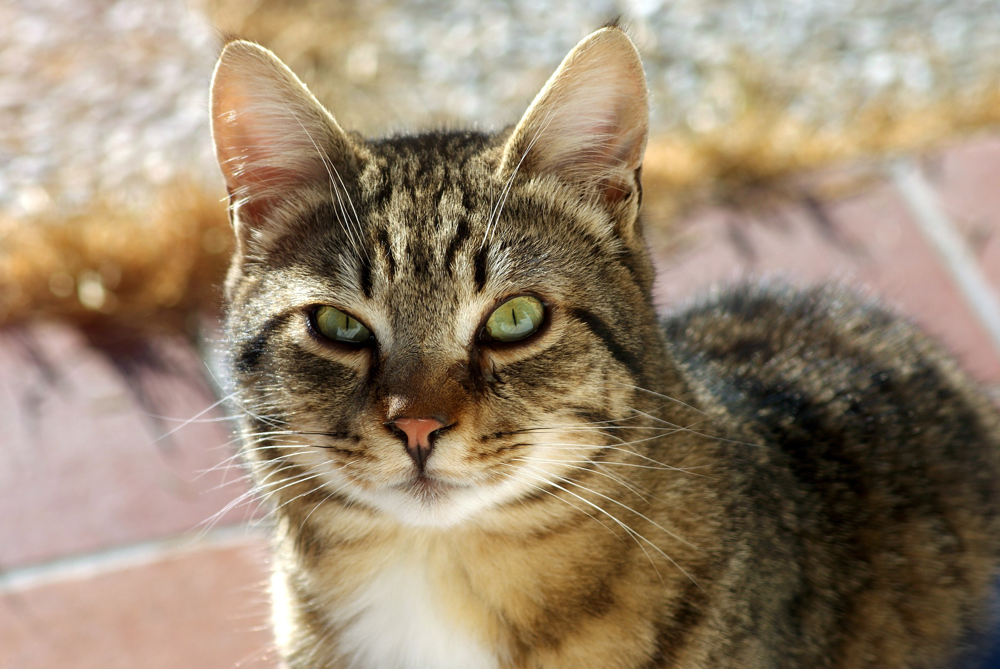

In [ ]:
cat_image = Image.fromarray(io.imread(cat_img_url)).convert("RGB")
cat_image.save('./cat.jpeg')
cat_image

[Lion or boar?](https://www.cbsnews.com/news/loose-lion-triggered-alarm-near-berlin-likely-a-boar-german-officials/)

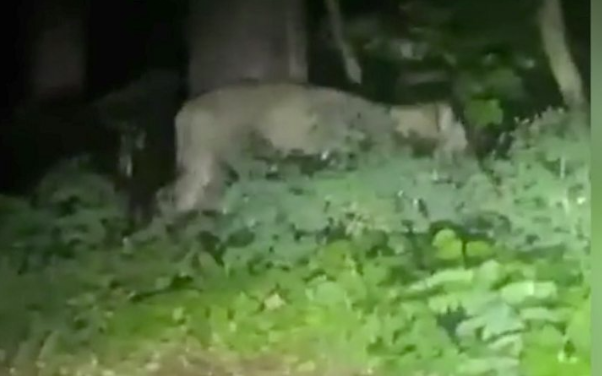

In [ ]:
lion_boar_image = Image.fromarray(io.imread(lion_boar_url)).convert("RGB")
lion_boar_image.save('./lion_boar.jpeg')
lion_boar_image

In [ ]:
# Inspect the original transformations applied to the pretrained model
ResNet34_Weights.IMAGENET1K_V1.transforms()

ImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)

# Explore the impact of resizing and normalization on the model's predictions and class activation mappings

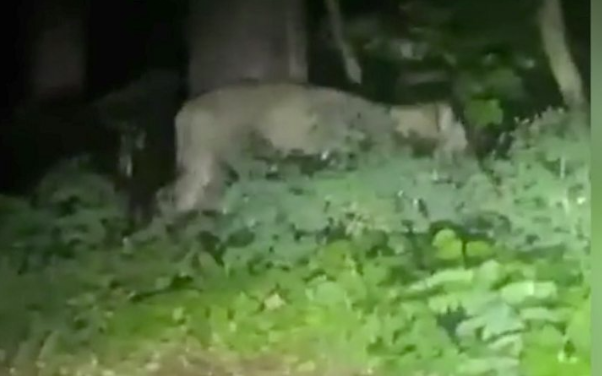

In [ ]:
# Define preprocessing transformations
preprocess = transforms.Compose([
    # Try commenting out the Resize
    transforms.Resize((224, 224)),
    transforms.ToImage(),
    transforms.ToDtype(torch.float32, scale=True),
    # Try commenting out the normalization
    #transforms.Normalize(mean=[0.485, 0.456, 0.406],
    #                     std=[0.229, 0.224, 0.225]),
])

# Load and preprocess the input image
im_array = io.imread(lion_boar_url)
#im_array = io.imread(lion_boar_url)
img = Image.fromarray(im_array).convert('RGB')
input_tensor = preprocess(img).unsqueeze(0)  # Add batch dimension

img

In [ ]:
# Hook for extracting the activations from the last convolutional layer
activations = []
def hook_fn(module, input, output):
    activations.append(output)

In [ ]:
# Inspect the modules inside our model
model._modules

{'conv1': Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False),
 'bn1': BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
 'relu': ReLU(inplace=True),
 'maxpool': MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False),
 'layer1': Sequential(
   (0): BasicBlock(
     (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
     (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (relu): ReLU(inplace=True)
     (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
     (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   )
   (1): BasicBlock(
     (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
     (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (relu): ReLU(inplace=True)
     (conv2): Conv2d(6

In [ ]:
# We can get any module by name
model._modules.get("layer4")

Sequential(
  (0): BasicBlock(
    (conv1): Conv2d(256, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (downsample): Sequential(
      (0): Conv2d(256, 512, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): BasicBlock(
    (conv1): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1

In [ ]:
# Register the hook
layer_name = 'layer4'  # Last convolutional block
hook = model._modules.get(layer_name).register_forward_hook(hook_fn)

# Forward pass
output = model(input_tensor)

# Remove the hook
hook.remove()

# Get the weights of the fully connected layer
fc_weights = model.fc.weight.detach()

# Select the class index (e.g., 0 for 'tench')
class_idx = torch.argmax(output, dim=1).item()

class_idx

279

In [ ]:
sofmax_output = torch.nn.functional.softmax(output, dim=1)
sofmax_output.squeeze()[class_idx].item()

0.11199983954429626

## Inspect Imagenet1K's classes

In [ ]:
label_mapping = ResNet34_Weights.IMAGENET1K_V1.meta['categories']
label_mapping[:10]

['tench',
 'goldfish',
 'great white shark',
 'tiger shark',
 'hammerhead',
 'electric ray',
 'stingray',
 'cock',
 'hen',
 'ostrich']

In [ ]:
boar_idx = label_mapping.index('wild boar')
lion_idx = label_mapping.index('lion')
boar_idx, lion_idx

(342, 291)

In [ ]:
# Get the top 3 predicted probabilities and class indices
topk_probs, topk_indices = torch.topk(sofmax_output, 3)

# Print the results
print("Top 3 Predictions:")
for i in range(3):
  prob = topk_probs.squeeze()[i].item()
  class_idx = topk_indices.squeeze()[i].item()
  class_name = label_mapping[class_idx]
  print(f"class index: {class_idx}, {class_name}, probability = {prob:.2f}")



Top 3 Predictions:
class index: 279, Arctic fox, probability = 0.11
class index: 363, armadillo, probability = 0.07
class index: 149, dugong, probability = 0.07


## Option 1: CAM Implementation with Global Average Pooling

This is the most readable implementation of CAM and is the closest to the one that we see in the [original paper](https://arxiv.org/abs/1512.04150). The "Global Average Pooling" operation described in that publication is implemented in PyTorch as `F.adaptive_avg_pool2d` and `nn.AdaptiveAvgPool2d`.

* [`F.adaptive_avg_pool2d`](https://pytorch.org/docs/stable/generated/torch.nn.functional.adaptive_avg_pool2d.html) is a functional implementation that we can use inside a `forward()` definition or on individual tensors
* [`nn.AdaptiveAvgPool2d`](https://pytorch.org/docs/stable/generated/torch.nn.AdaptiveAvgPool2d.html) is an [`nn.Module`](https://pytorch.org/docs/stable/generated/torch.nn.Module.html) component, like the ones we see on the PyTorch implementations of the ResNet and VGG architectures.

In [ ]:
import torch
import torch.nn.functional as F

# Suppose fc_weights has shape [num_classes, channels]
# and activations has shape [1, batch_size, channels, H, W].
# We'll just show the relevant slices for the single 'class_idx'
# and the first image in the batch.
weight = fc_weights[class_idx]        # shape [channels]
act = activations[0][0]               # shape [channels, H, W]

# ----------------------------------------------------------------
# 1) The "global average pooling" from a usual forward pass:
#    collapses (H, W) -> 1x1, giving us one value per channel.
# ----------------------------------------------------------------
pooled = F.adaptive_avg_pool2d(act.unsqueeze(0), 1)  # shape [1, channels, 1, 1]
pooled = pooled.squeeze(0).squeeze(-1).squeeze(-1)   # shape [channels]
# 'pooled' is the channel-wise average. Multiplying by 'weight' then summing
# would give the final logit for 'class_idx'.

score = (pooled * weight).sum()  # The single scalar logit for class_idx

# ----------------------------------------------------------------
# 2) Building the CAM:
#    multiply each channel map by its weight, then sum across channels.
# ----------------------------------------------------------------

cam = (act * weight.view(-1, 1, 1)).sum(dim=0)  # shape [H, W]

# Normalize CAM
# This ensures all values fall within [0, 1], where 0 represents the least important regions
# and 1 represents the most important regions for prediction of the target class.
cam = cam - cam.min()
cam = cam / cam.max()

# The class activation mapping is a weighted sum by the weight given to each globally pooled activation
print(cam.shape)  # [H, W]


torch.Size([7, 7])


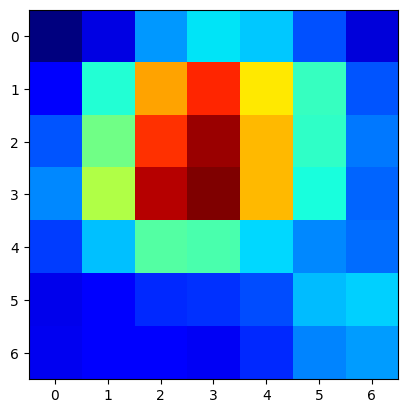

In [ ]:
plt.imshow(cam.detach(), cmap="jet");

In [ ]:
# The activations were originally 512
act.shape

torch.Size([512, 7, 7])

## Explore unweighted activations

We can verify that the individual activations are different than our CAM. We combine them as a *weighted sum* to produce CAM. The weights come from the final layer of the model


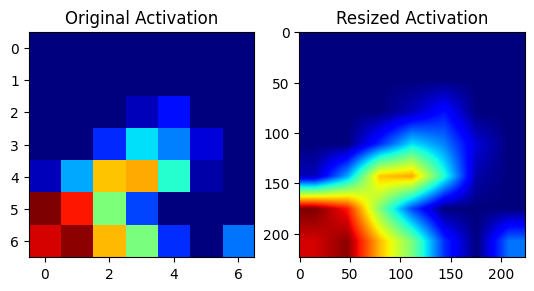

In [ ]:
# @title Explore  activations {run:"auto"}

slider_value = 77  # @param {type: "slider", min: 0, max: 511}

plt.subplot(1, 2, 1)  # Create a subplot with 1 row, 2 columns, and select the 1st subplot
plt.imshow(act[slider_value, :, :].detach(), cmap="jet")
plt.title("Original Activation")  # Add a title to the subplot

# Convert the tensor to a PIL Image
cam_img = Image.fromarray(act[slider_value, :, :].detach().numpy())
# Resize using PIL.Image.resize, which supports resampling
cam_resized_224 = cam_img.resize((224, 224), resample=Image.BILINEAR)
# Convert back to a NumPy array for plotting
cam_resized_224 = np.array(cam_resized_224)


plt.subplot(1, 2, 2)  # Select the 2nd subplot
plt.imshow(cam_resized_224, cmap="jet")
plt.title("Resized Activation");  # Add a title to the subplot # Moved this line here

## The role of resizing with interpolation

The activation maps are a very small images. We use interpolation before adding them to the input image.

[Bilinear interpolation](https://en.wikipedia.org/wiki/Bilinear_interpolation) estimates a pixel's value using a weighted average of its four nearest neighbors. We use this operation frequently to resize inputs and outputs from neural networks. We discuss it in detail [in this video](https://www.youtube.com/watch?v=AV2wgR_YPpM).






![](https://raw.githubusercontent.com/andandandand/practical-computer-vision/refs/heads/main/artifacts/bilinear_interpolation.png)

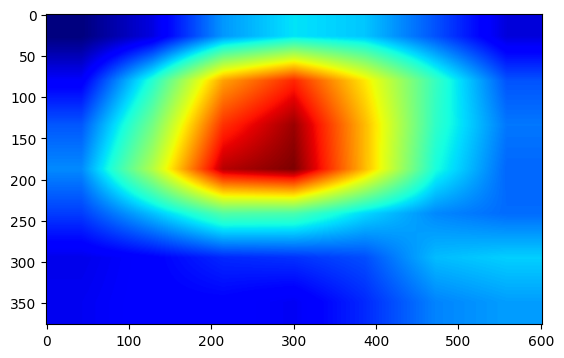

In [ ]:
cam_resized = np.array(Image.fromarray(cam.detach().numpy()).resize(img.size, resample=Image.BILINEAR))
plt.imshow(cam_resized, cmap="jet");

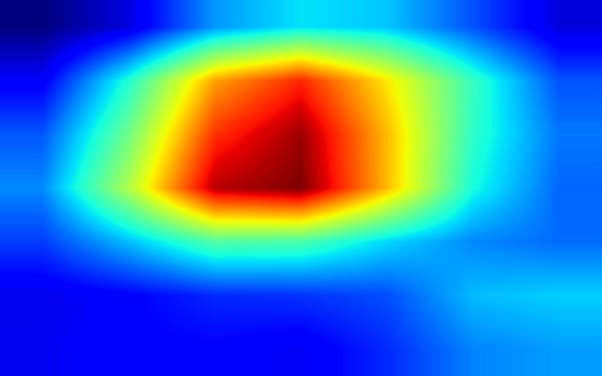

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib

# For a CAM with shape (height, width)
def save_cam_image_with_jet(cam, save_path):
    # Ensure we're working with a 2D array
    cam = cam.squeeze()

    # Apply the jet colormap to the values (still in range [0,1])
    # This converts to an RGBA array with values in [0,1]
    cmap = plt.cm.jet
    colored_cam = cmap(cam)

    # Convert from RGBA to RGB by discarding the alpha channel
    colored_cam_rgb = colored_cam[:, :, :3]

    # Scale to [0,255] and convert to uint8 for PIL
    colored_cam_rgb_scaled = (colored_cam_rgb * 255).astype(np.uint8)

    # Create a PIL Image
    img = Image.fromarray(colored_cam_rgb_scaled, mode='RGB')

    # Save as JPEG
    img.save(save_path, format='JPEG', quality=95)

    return img

# Usage
cam_img = save_cam_image_with_jet(cam_resized, 'class_activation_map.jpg')
cam_img

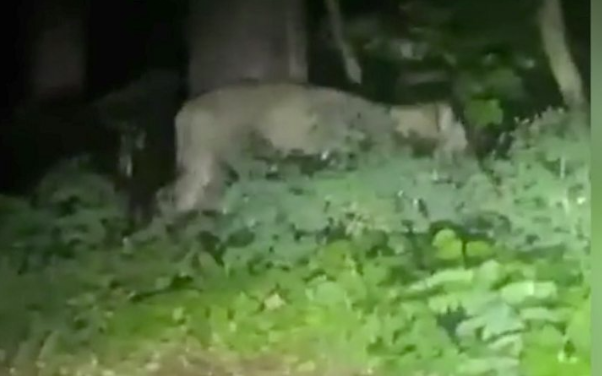

In [ ]:
img

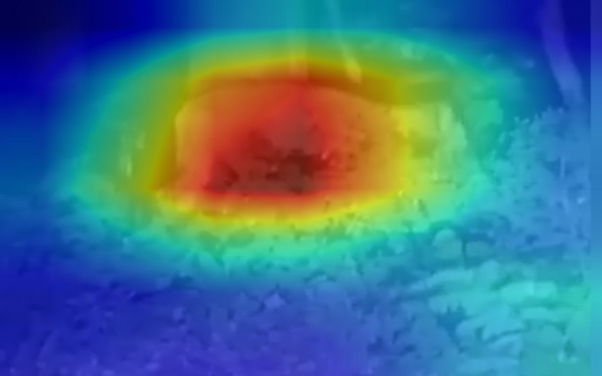

In [ ]:
# @title Image blending {run:"auto"}
# @markdown We can define the level of transparency for our overlay

slider_value = 0.27  # @param {type: "slider", min: 0.01, max: 0.99, step:0.01}

blended_img = Image.blend(img, cam_img, 0.6)
blended_img


## Follow-up Exercises:

Refine your understanding with these exercises:

1.  **Diverse Images:**
    *   Find 2-3 varied online images (e.g., single object, multiple objects, ambiguous).
    *   Generate CAMs for these images using `layer4` activations and `fc` weights.
    *   Analyze CAMs: Do they show expected regions for top predictions? Note surprises.
    *   **Bonus:** Observe CAM for a potentially misclassified image's predicted class.

2.  **Target Specific Classes:**
    *   For "lion\_boar", generate CAMs for "lion" (`lion_idx`) and "wild boar" (`boar_idx`), including non-top predictions.
    *   Compare CAMs. How do they differ? Does a non-top prediction's CAM show relevant features? (Hint: Use class index for `fc_weights`).

3.  **Earlier Layers & CAM Scope:**
    *   CAM uses `layer4` activations.
    *   **Part A (Earlier Activations):**
        *   Hook and visualize individual feature maps from an earlier layer (`model.layer3` or `model.layer2`).
        *   What patterns/features do earlier layers show? Generic (edges, textures) or complex?
    *   **Part B (CAM's Application):**
        *   CAM uses `model.fc.weight`, linked to pooled `layer4` features.
        *   Explain why `model.fc.weight` cannot be used with `model.layer3` activations for CAM as with `layer4`. Consider:
            *   Channel counts (`layer3` vs. `layer4`).
            *   Meaning of `model.fc.weight` in the architecture.
        *   This shows why CAM often uses the last convolutional layer and Grad-CAM is more flexible.

4.  **Preprocessing Effects:**
    *   Test impacts of removing `transforms.Resize` and `transforms.Normalize`.
    *   **a) No Resize:** Remove `transforms.Resize((224, 224))`.
        *   What occurs when passing the image to the model? (ResNet34 input size).
        *   If variable input sizes led to variable `layer4` feature map sizes, how would CAM calculation and resizing change?
    *   **b) No Normalization:** Remove `transforms.Normalize(...)`.
        *   How are top prediction probabilities affected?
        *   How is `layer4` CAM appearance/focus affected?
    *   Document observations.

5.  **CAM for Different Model:**
    *   Implement CAM for another pretrained model (e.g., `resnet18`, `resnet50`) with a final conv block, GAP, and FC layer.
    *   Identify:
        *   Last convolutional layer/block name.
        *   Final fully connected layer name.
    *   Adapt hook and weight retrieval.
    *   Generate CAMs. Do they suit the new model's predictions?

6.  **CAM Generation Function:**
    *   Create a Python function.
    *   Input: model, image tensor, final conv layer name, FC layer name, optional target class index.
    *   Output: CAM (NumPy array, normalized).
    *   Purpose: Reusable CAM logic.
    *   Signature: `def generate_cam(model, input_tensor, final_conv_layer_name, fc_layer_name, target_class_idx=None):`

7.  **Advanced: Grad-CAM (Concept & Challenge):**
    *   CAM is often limited to the final convolutional layer.
    *   Read about [Grad-CAM](https://arxiv.org/abs/1610.02391), a gradient-based generalization for any convolutional layer, not requiring a specific structure like GAP before the FC layer.
    *   **Challenge (Optional):** Implement basic Grad-CAM. Steps:
        *   Get feature maps from chosen layer.
        *   Calculate target class score gradient w.r.t. feature maps.
        *   Weight feature maps by these gradients (often average gradients spatially).
        *   Combine and apply ReLU.
    *   Grad-CAM is valuable for its broad application.